In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import missingno as mns

In [82]:
df = pd.read_csv('16k_Movies.csv')
df.head()

,Unnamed: 0,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres
0,0,Dekalog (1988),"Mar 22, 1996",This masterwork by Krzysztof Kieślowski is one...,7.4,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",9 h 32 m,Drama
1,1,Three Colors: Red,"Nov 23, 1994",Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance"
2,2,The Conformist,"Oct 22, 1970","Set in Rome in the 1930s, this re-release of B...",7.3,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",1 h 47 m,Drama
3,3,Tokyo Story,"Mar 13, 1972",Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",2 h 16 m,Drama
4,4,The Leopard (re-release),"Aug 13, 2004","Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",3 h 7 m,"Drama,History"


In [83]:
df.isnull().sum()

Unnamed: 0                0
Title                     0
Release Date              0
Description               0
Rating                 3444
No of Persons Voted    3461
Directed by               7
Written by              963
Duration                 13
Genres                    5
dtype: int64

In [84]:
df= df.drop('Unnamed: 0', axis=1)

<Axes: >

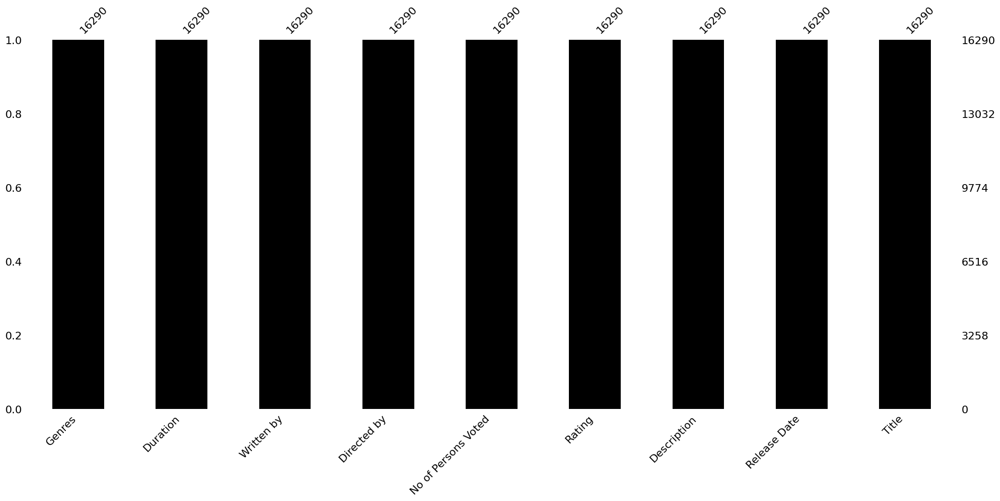

In [85]:
# #What percentage of missing or null values exist in key columns such as Description, Directed by, and Written by? How would you handle these missing values?
import warnings
warnings.filterwarnings("ignore")
category = df.select_dtypes(include=['object','category'])
numerical = df.select_dtypes(include=['int','float'])
for x in category:
    df[x].fillna(df[x].mode()[0],inplace=True)
for x in numerical:
    df[x].fillna(df[x].mean(),inplace=True)
mns.bar(df, sort='descending',color = 'black')

In [86]:
#Perform a summary of basic statistics (mean, median, standard deviation, min, and max) for the Rating column. Identify any outliers in movie ratings using statistical methods such as Z-scores or IQR.
mean_rating = df['Rating'].mean()
median_rating = df['Rating'].median()
std_rating = df['Rating'].std()
min_rating = df['Rating'].min()
max_rating = df['Rating'].max()

print(f"Mean Rating: {mean_rating}")
print(f"Median Rating: {median_rating}")
print(f"Standard Deviation: {std_rating}")
print(f"Minimum Rating: {min_rating}")
print(f"Maximum Rating: {max_rating}")


Mean Rating: 6.617631947687996
Median Rating: 6.617631947687997
Standard Deviation: 1.2567816250377946
Minimum Rating: 0.3
Maximum Rating: 10.0


In [87]:
df['Z-score'] = np.abs((df['Rating'] - mean_rating) / std_rating)
outliers_z = df[df['Z-score']> 2]
print('Outliers using Z-score method:')
print(outliers_z)

Outliers using Z-score method:
                                 Title  Release Date  \
5                        The Godfather  Mar 24, 1972   
156      Never Rarely Sometimes Always  Mar 13, 2020   
262                        Wojnarowicz  Mar 19, 2021   
439    Restless Creature: Wendy Whelan  May 24, 2017   
452              Our Father, the Devil  Aug 25, 2023   
...                                ...           ...   
16273                        Strippers   Dec 8, 2000   
16274                           Vulgar  Apr 26, 2002   
16276               The Singing Forest  Nov 14, 2003   
16277      The Garbage Pail Kids Movie  Aug 22, 1987   
16279                  United Passions   Jun 5, 2015   

                                             Description  Rating  \
5      Francis Ford Coppola's epic features Marlon Br...     9.3   
156    Faced with an unintended pregnancy and a lack ...     0.9   
262    Wojnarowicz: F**k You F*ggot F**ker is a fiery...     2.5   
439    Restless Creature

In [88]:
Q1 = df['Rating'].quantile(0.25)
Q3 = df['Rating'].quantile(0.75)
IQR = Q3 - Q1
outliers_iqr = df[(df['Rating'] < (Q1 - 1.5*IQR)) | (df['Rating'] > (Q3 + 1.5*IQR))]
outliers_iqr

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Z-score
156,Never Rarely Sometimes Always,"Mar 13, 2020",Faced with an unintended pregnancy and a lack ...,0.9,"1,997",Eliza Hittman,Eliza Hittman,1 h 41 m,Drama,4.549424
262,Wojnarowicz,"Mar 19, 2021",Wojnarowicz: F**k You F*ggot F**ker is a fiery...,2.5,4,Chris McKim,Woody Allen,1 h 45 m,Documentary,3.276330
439,Restless Creature: Wendy Whelan,"May 24, 2017",Restless Creature: Wendy Whelan offers an inti...,4.0,4,"Linda Saffire, \n \n Adam Schlesinger",Woody Allen,1 h 30 m,Documentary,2.082806
453,The Body Remembers When the World Broke Open,"Nov 22, 2019",Two Indigenous women living very different liv...,3.9,8,"Kathleen Hepburn, \n \n Elle-Máijá Tai...","Kathleen Hepburn, Elle-Máijá Tailfeathers",1 h 45 m,Drama,2.162374
507,Maria Full of Grace,"Jul 16, 2004","This film follows a bright, gutsy young woman ...",2.0,197,Joshua Marston,Joshua Marston,1 h 41 m,"Crime,Drama",3.674172
...,...,...,...,...,...,...,...,...,...,...
16273,Strippers,"Dec 8, 2000",Alan is having an horrendous day...he loses hi...,2.7,16,Jorge Ameer,Jorge Ameer,1 h 11 m,"Drama,Comedy",3.117194
16274,Vulgar,"Apr 26, 2002","The misadventures of Will, a struggling profes...",2.0,49,Bryan Johnson,Bryan Johnson,1 h 27 m,"Crime,Drama,Thriller",3.674172
16276,The Singing Forest,"Nov 14, 2003","Two lovers, killed during the Holocaust, are r...",1.7,32,Jorge Ameer,Jorge Ameer,1 h 35 m,"Drama,Fantasy,Romance",3.912877
16277,The Garbage Pail Kids Movie,"Aug 22, 1987",Dodger must confront the struggles of life as ...,1.0,21,Rod Amateau,"Linda Palmer, Rod Amateau, John Pound",1 h 40 m,"Adventure,Comedy,Family,Fantasy,Musical",4.469855


In [89]:
fig = px.box(df, y='Rating', title='Movie Rating Boxplot')
fig.add_scatter(x=df.index, y=outliers_z['Rating'], mode='markers', name='Outliers (Z-Score)')
fig.add_scatter(x=df.index, y=outliers_iqr['Rating'], mode='markers', name='Outliers (IQR)')
fig.show()

In [90]:
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Z-score
0,Dekalog (1988),"Mar 22, 1996",This masterwork by Krzysztof Kieślowski is one...,7.4,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",9 h 32 m,Drama,0.622517
1,Three Colors: Red,"Nov 23, 1994",Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance",1.338632
2,The Conformist,"Oct 22, 1970","Set in Rome in the 1930s, this re-release of B...",7.3,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",1 h 47 m,Drama,0.542949
3,Tokyo Story,"Mar 13, 1972",Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",2 h 16 m,Drama,1.179495
4,The Leopard (re-release),"Aug 13, 2004","Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",3 h 7 m,"Drama,History",0.940790


In [91]:
df = df.drop('Z-score', axis=1)
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres
0,Dekalog (1988),"Mar 22, 1996",This masterwork by Krzysztof Kieślowski is one...,7.4,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",9 h 32 m,Drama
1,Three Colors: Red,"Nov 23, 1994",Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance"
2,The Conformist,"Oct 22, 1970","Set in Rome in the 1930s, this re-release of B...",7.3,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",1 h 47 m,Drama
3,Tokyo Story,"Mar 13, 1972",Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",2 h 16 m,Drama
4,The Leopard (re-release),"Aug 13, 2004","Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",3 h 7 m,"Drama,History"


In [92]:
#How many unique genres exist in the dataset? What are the most common genres over time?
df['Release Date'] = pd.to_datetime(df['Release Date'])
df['Release Month'] = df['Release Date'].dt.month
df['Release Year'] = df['Release Date'].dt.year
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",9 h 32 m,Drama,3,1996
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance",11,1994
2,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",1 h 47 m,Drama,10,1970
3,Tokyo Story,1972-03-13,Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",2 h 16 m,Drama,3,1972
4,The Leopard (re-release),2004-08-13,"Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",3 h 7 m,"Drama,History",8,2004


In [93]:
df['Genres'].nunique()

1663

In [94]:
df['Genre'] = df['Genres']
df['Genre'] = df['Genre'].str.split(',')
df = df.explode('Genre')
df['Genre'] = df['Genre'].str.strip()
df = df.reset_index(drop=True)

In [95]:
df['Genre'].value_counts()
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",9 h 32 m,Drama,3,1996,Drama
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance",11,1994,Drama
2,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance",11,1994,Mystery
3,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance",11,1994,Romance
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",1 h 47 m,Drama,10,1970,Drama


In [96]:
df_genre_over_time = df.groupby('Release Year')['Genre'].value_counts().reset_index(name='Count')
df_genre_over_time

,Release Year,Genre,Count
0,1970,Drama,21
1,1970,Comedy,12
2,1970,Documentary,5
3,1970,Romance,5
4,1970,Music,4
...,...,...,...
1137,2024,Animation,11
1138,2024,Sport,7
1139,2024,Musical,4
1140,2024,Western,4


In [97]:
fig = px.bar(df_genre_over_time, x='Release Year', y='Count', color='Genre', title='Genre Distribution Over Time')
fig.show()

In [98]:
#Convert the Release Date column into components like year and month. What are the most frequent movie release years and months?
release_year = df['Release Year'].value_counts()
release_year

Release Year
2014    1939
2015    1813
2016    1766
2018    1759
2017    1702
2019    1653
2013    1643
2021    1533
2022    1525
2011    1471
2012    1462
2020    1460
2006    1384
2023    1341
2005    1340
2007    1314
2004    1298
2010    1205
2002    1178
2008    1159
2003    1133
2009    1112
2001    1048
2000     986
2024     787
1999     769
1998     539
1997     479
1996     454
1993     439
1995     438
1990     408
1992     384
1986     378
1994     375
1989     346
1987     338
1985     315
1991     314
1984     298
1988     296
1982     238
1983     222
1980     219
1981     219
1979     180
1978     147
1976     142
1974     134
1973     129
1971     127
1975     115
1977     101
1972      90
1970      81
Name: count, dtype: int64

In [99]:
release_months = df['Release Month'].value_counts()
release_months

Release Month
10    4173
8     4015
4     3906
3     3859
9     3829
11    3826
6     3724
12    3722
7     3612
5     3444
2     3149
1     2466
Name: count, dtype: int64

In [100]:
fig1= px.bar(release_year.head(10), title='Top 10 Release Years')
fig2 = px.bar(release_months.head(10), title='Top 10 Release Months')
fig1.show()
fig2.show()

In [101]:
#How many duplicate movies exist based on the Title column? What steps would you take to remove duplicates, if any?
df.duplicated(subset='Title').sum()

np.int64(29032)

In [102]:
df.drop_duplicates(subset='Title', keep='first')

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.400000,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",9 h 32 m,Drama,3,1996,Drama
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.300000,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",1 h 39 m,"Drama,Mystery,Romance",11,1994,Drama
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.300000,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",1 h 47 m,Drama,10,1970,Drama
5,Tokyo Story,1972-03-13,Yasujiro Ozu’s Tokyo Story follows an aging co...,8.100000,147,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",2 h 16 m,Drama,3,1972,Drama
6,The Leopard (re-release),2004-08-13,"Set in Sicily in 1860, Luchino Visconti's spec...",7.800000,85,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",3 h 7 m,"Drama,History",8,2004,Drama
...,...,...,...,...,...,...,...,...,...,...,...,...
43717,Boys to Men,2001-04-27,Compilation of 4 short films from different di...,6.617632,4,Woody Allen,Woody Allen,\n https://www.amazon.com/Boys-Men-Phil...,Drama,4,2001,Drama
43718,Saint Misbehavin': The Wavy Gravy Movie,2010-12-10,"Beginning with Woodstock ‘99, director Michell...",6.617632,4,Michelle Esrick,Woody Allen,Not Rated,Documentary,12,2010,Documentary
43719,Collectors,2000-10-01,America is drawn to the macabre handiwork of t...,6.617632,4,Julian P. Hobbs,Woody Allen,1 h 20 m,Documentary,10,2000,Documentary
43720,Bonhoeffer,2003-06-20,Dramatic documentary about the young German pa...,6.617632,4,Martin Doblmeier,Martin Doblmeier,1 h 33 m,"Documentary,Biography,History,War",6,2003,Documentary


In [103]:
# Perform frequency counts of categorical columns such as Directed by and Written by. Which directors and screenwriters have the most movies in the dataset?
director_count = df['Directed by'].value_counts()
director_count.head(10)

Directed by
Woody Allen           134
Ridley Scott          125
Ron Howard            125
Clint Eastwood        111
Steven Spielberg       99
Paul W.S. Anderson     97
Robert Zemeckis        94
Steven Soderbergh      88
Joel Schumacher        82
Barry Levinson         81
Name: count, dtype: int64

In [104]:
writer_count = df['Written by'].value_counts()
writer_count.head(10)

Written by
Woody Allen                                    1921
Tyler Perry                                      50
David Mamet                                      46
Steven Knight                                    45
Alex Litvak, Andrew Davies, Alexandre Dumas      45
M. Night Shyamalan                               39
Lowell Ganz, Babaloo Mandel, Nick Hornby         36
Brian Helgeland, Ethan Reiff, Cyrus Voris        36
Patty Jenkins                                    36
Hal Hartley                                      33
Name: count, dtype: int64

In [105]:
fig1 = px.bar(director_count.head(10), title='Top 10 Directors')
fig2 = px.bar(writer_count.head(10), title='Top 10 Screenwriters')
fig1.show()
fig2.show()

In [106]:
df['Duration'].unique()

array(['9 h 32 m', '1 h 39 m', '1 h 47 m', '2 h 16 m', '3 h 7 m',
       '2 h 55 m', '2 h 45 m', '3 h 36 m', '3 h 8 m', '2 h 35 m',
       '2 h 25 m', '1 h 31 m', '1 h 34 m', '1 h 58 m', '2 h 50 m',
       '2 h 33 m', '1 h 43 m', '2 h 42 m', '1 h 41 m', '2 h 2 m',
       '1 h 53 m', '2 h 12 m', '1 h 50 m', '2 h 15 m', '2 h 5 m',
       '1 h 21 m', '1 h 57 m', '2 h 14 m', '2 h 17 m', '2 h 1 m',
       '\n        http://www.killerofsheep.com/\n        ', '2 h 40 m',
       '1 h 51 m', '3 h 10 m', '1 h 52 m', '1 h 33 m', '1 h 8 m', '2 h',
       'TV-MA', '2 h 43 m', '1 h 38 m', '2 h 7 m', '2 h 11 m', '2 h 34 m',
       '2 h 37 m', '1 h 49 m', '2 h 3 m', '3 h 15 m', '1 h 46 m',
       '1 h 35 m', '1 h 54 m', '2 h 58 m', '2 h 53 m', '2 h 30 m',
       '3 h 29 m', '1 h 29 m', '1 h 23 m', '1 h 28 m', '2 h 6 m',
       '1 h 30 m', '3 h 21 m', '2 h 13 m', '2 h 9 m', '5 h 25 m',
       '1 h 44 m', '2 h 8 m', '3 h 22 m', '1 h 12 m', '1 h 45 m',
       '4 h 33 m', '1 h 42 m', '2 h 48 m', '1 h 36 m

In [107]:
import re
df['Duration'] = df['Duration'].apply(lambda x: re.sub(r'\d\:hms', '', str(x)))
df['Duration'].unique()

array(['9 h 32 m', '1 h 39 m', '1 h 47 m', '2 h 16 m', '3 h 7 m',
       '2 h 55 m', '2 h 45 m', '3 h 36 m', '3 h 8 m', '2 h 35 m',
       '2 h 25 m', '1 h 31 m', '1 h 34 m', '1 h 58 m', '2 h 50 m',
       '2 h 33 m', '1 h 43 m', '2 h 42 m', '1 h 41 m', '2 h 2 m',
       '1 h 53 m', '2 h 12 m', '1 h 50 m', '2 h 15 m', '2 h 5 m',
       '1 h 21 m', '1 h 57 m', '2 h 14 m', '2 h 17 m', '2 h 1 m',
       '\n        http://www.killerofsheep.com/\n        ', '2 h 40 m',
       '1 h 51 m', '3 h 10 m', '1 h 52 m', '1 h 33 m', '1 h 8 m', '2 h',
       'TV-MA', '2 h 43 m', '1 h 38 m', '2 h 7 m', '2 h 11 m', '2 h 34 m',
       '2 h 37 m', '1 h 49 m', '2 h 3 m', '3 h 15 m', '1 h 46 m',
       '1 h 35 m', '1 h 54 m', '2 h 58 m', '2 h 53 m', '2 h 30 m',
       '3 h 29 m', '1 h 29 m', '1 h 23 m', '1 h 28 m', '2 h 6 m',
       '1 h 30 m', '3 h 21 m', '2 h 13 m', '2 h 9 m', '5 h 25 m',
       '1 h 44 m', '2 h 8 m', '3 h 22 m', '1 h 12 m', '1 h 45 m',
       '4 h 33 m', '1 h 42 m', '2 h 48 m', '1 h 36 m

In [108]:
df.isnull().sum()

Title                  0
Release Date           0
Description            0
Rating                 0
No of Persons Voted    0
Directed by            0
Written by             0
Duration               0
Genres                 0
Release Month          0
Release Year           0
Genre                  0
dtype: int64

In [109]:
def clean_duration(text):
    pattern = r'(\d+\s*h\s*\d+\s*m)'
    match = re.search(pattern, text)
    return match.group(0).replace(' ', '') if match else ''
df['Duration'] = df['Duration'].apply(clean_duration)
df['Duration'].unique()


array(['9h32m', '1h39m', '1h47m', '2h16m', '3h7m', '2h55m', '2h45m',
       '3h36m', '3h8m', '2h35m', '2h25m', '1h31m', '1h34m', '1h58m',
       '2h50m', '2h33m', '1h43m', '2h42m', '1h41m', '2h2m', '1h53m',
       '2h12m', '1h50m', '2h15m', '2h5m', '1h21m', '1h57m', '2h14m',
       '2h17m', '2h1m', '', '2h40m', '1h51m', '3h10m', '1h52m', '1h33m',
       '1h8m', '2h43m', '1h38m', '2h7m', '2h11m', '2h34m', '2h37m',
       '1h49m', '2h3m', '3h15m', '1h46m', '1h35m', '1h54m', '2h58m',
       '2h53m', '2h30m', '3h29m', '1h29m', '1h23m', '1h28m', '2h6m',
       '1h30m', '3h21m', '2h13m', '2h9m', '5h25m', '1h44m', '2h8m',
       '3h22m', '1h12m', '1h45m', '4h33m', '1h42m', '2h48m', '1h36m',
       '2h38m', '1h22m', '1h40m', '1h59m', '2h47m', '1h48m', '1h10m',
       '2h10m', '3h2m', '1h37m', '1h56m', '1h55m', '1h27m', '2h20m',
       '2h26m', '2h28m', '2h59m', '2h4m', '2h52m', '2h18m', '2h21m',
       '1h18m', '3h17m', '3h13m', '1h20m', '2h49m', '1h32m', '3h20m',
       '4h6m', '1h15m', '2h27

In [110]:
df.isnull().sum()

Title                  0
Release Date           0
Description            0
Rating                 0
No of Persons Voted    0
Directed by            0
Written by             0
Duration               0
Genres                 0
Release Month          0
Release Year           0
Genre                  0
dtype: int64

In [111]:
def duration_to_minutes(text):
    match = re.match(r'(?:(\d+)h)?(?:(\d+)m)?', text)
    
    if match:
        hours = int(match.group(1)) if match.group(1) else 0
        minutes = int(match.group(2)) if match.group(2) else 0
        return hours * 60 + minutes
    return 0 
df['Duration'] = df['Duration'].apply(duration_to_minutes)

df['Duration'].unique()

array([572,  99, 107, 136, 187, 175, 165, 216, 188, 155, 145,  91,  94,
       118, 170, 153, 103, 162, 101, 122, 113, 132, 110, 135, 125,  81,
       117, 134, 137, 121,   0, 160, 111, 190, 112,  93,  68, 163,  98,
       127, 131, 154, 157, 109, 123, 195, 106,  95, 114, 178, 173, 150,
       209,  89,  83,  88, 126,  90, 201, 133, 129, 325, 104, 128, 202,
        72, 105, 273, 102, 168,  96, 158,  82, 100, 119, 167, 108,  70,
       130, 182,  97, 116, 115,  87, 140, 146, 148, 179, 124, 172, 138,
       141,  78, 197, 193,  80, 169,  92, 200, 246,  75, 147,  85, 139,
       206, 321, 255,  84, 184, 217, 495,  69, 272,  76, 196,  65, 142,
       729,  86,  63, 230,  77, 144, 189, 151,  79, 149, 152, 171, 224,
       143,  73,  71, 231, 226, 159, 156, 186, 244, 164,  74, 250, 174,
       220, 161, 191, 238, 181, 237, 295,  66, 808, 183, 205, 239, 229,
        61, 194, 218, 215, 260,  67, 176, 198, 317, 166, 177, 192, 270,
       219])

In [112]:
def classify_duration(minutes):
    if minutes < 90:
        return 'Short'
    elif minutes < 120:
        return 'Medium'
    else: 
        return 'Long'
df['Duration Category'] = df['Duration'].apply(classify_duration)
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",572,Drama,3,1996,Drama,Long
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Drama,Medium
2,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Mystery,Medium
3,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Romance,Medium
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",107,Drama,10,1970,Drama,Medium


In [113]:
duration_counts = df['Duration Category'].value_counts()
duration_counts

Duration Category
Medium    29021
Short      7858
Long       6846
Name: count, dtype: int64

In [114]:
duration_rating = df.groupby('Duration Category')['Rating'].mean()
duration_rating

Duration Category
Long      6.982294
Medium    6.576471
Short     6.489527
Name: Rating, dtype: float64

In [115]:
fig1 = px.bar(x=duration_counts.index, y=duration_counts.values, title='Movies by Duration Category')
fig1.update_layout(xaxis_title='Duration Category', yaxis_title='Count')
fig2 = px.bar(x=duration_rating.index, y=duration_rating.values, title='Rating By Duration Category')
fig2.update_layout(xaxis_title='Duration Categoory', yaxis_title='Average Rating' )
fig1.show()
fig2.show()

In [116]:
df['No of Persons Voted'].unique()

array(['118', '241', '106', '147', '85', '4,102', '2,677', '446', '134',
       '22', '67', '4', '23', '1,872', '120', '233', '111', '214', '150',
       '49', '248', '2,098', '102', '887', '1,850', '1,666', '91',
       '1,694', '1,064', '77', '28', '30', '1,801', '21', '109', '3,711',
       '38', '62', '44', '2,336', '388', '232', '287', '46', '367', '977',
       '3,197', '1,306', '75', '793', '1,405', '1,993', '731', '602',
       '31', '3,385', '189', '1,325', '29', '76', '162', '1,371', '195',
       '563', '7', '69', '48', '363', '813', '57', '87', '177', '250',
       '3,220', '1,251', '5', '121', '694', '2,531', '17', '1,087', '39',
       '34', '317', '197', '737', '585', '18', '52', '24', '1,108', '45',
       '216', '12', '178', '41', '1,047', '126', '11', '53', '160', '32',
       '60', '208', '1,329', '399', '33', '58', '35', '405', '88', '36',
       '610', '89', '1,997', '234', '2,657', '125', '65', '99', '132',
       '1,266', '207', '90', '56', '219', '13', '19', '61

In [117]:
df['No of Persons Voted'] = pd.to_numeric(df['No of Persons Voted'], errors='coerce')
df= df.dropna(subset=['No of Persons Voted'])

In [118]:
df['No of Persons Voted'].mean()

np.float64(91.63857419822008)

In [119]:
df['No of Persons Voted'].median()

np.float64(24.0)

In [120]:
df['No of Persons Voted'].corr(df['Rating'])

np.float64(0.20769935113618818)

In [121]:
fig1 = px.scatter(x=df['No of Persons Voted'], y=df['Rating'], trendline='ols')
fig1.update_layout(title='Relationship between Votes and Rating', xaxis_title='No of Persons Voted', yaxis_title='Rating')
fig2= px.histogram(df, x='No of Persons Voted', title='Distribution of Votes')
fig2.update_layout(xaxis_title='Number of Votes', yaxis_title='Frequency')
fig1.show()
fig2.show()

In [122]:
director_counts = df['Directed by'].value_counts()
director_counts

Directed by
Woody Allen           134
Ron Howard            122
Clint Eastwood        107
Ridley Scott           98
Paul W.S. Anderson     97
                     ... 
Doug Nichol             1
Jasmin Mozaffari        1
Alicia Scherson         1
Hava Kohav Beller       1
Jason Bloom             1
Name: count, Length: 7354, dtype: int64

In [123]:
mean_movie = director_counts.mean()
mean_movie
median_movie = director_counts.median()
median_movie
max_movie = director_counts.max()
max_movie

np.int64(134)

In [124]:
fig = px.histogram(x=director_counts.values, title='Distribution of Movies Per Director')
fig.update_layout(xaxis_title='Number of Movies', yaxis_title='Frequency')
fig.show()

In [125]:
top_directors = director_counts.nlargest(10)
top_directors

Directed by
Woody Allen           134
Ron Howard            122
Clint Eastwood        107
Ridley Scott           98
Paul W.S. Anderson     97
Robert Zemeckis        89
Steven Soderbergh      88
Steven Spielberg       85
Joel Schumacher        82
Barry Levinson         81
Name: count, dtype: int64

In [126]:
fig = px.bar(x=top_directors.index, y=top_directors.values, title='Top 10 Directors with Most Movies')
fig.update_layout(xaxis_title='Director', yaxis_title='Number of Movies')
fig.show()

In [127]:
df['Decade'] = (df['Release Year'] // 10) * 10
decade_counts = df['Decade'].value_counts().sort_index()
decade_ratings = df.groupby('Decade')['Rating'].mean()
fig = px.bar(x=decade_counts.index, y=decade_counts.values, title='Distribution of Movies Across Decades')
fig.update_layout(xaxis_title='Decade', yaxis_title = 'Count')
fig.show()

In [128]:
fig = px.bar(x=decade_ratings.index, y=decade_ratings.values, title='Average Movie Rating by Decade')
fig.update_layout(xaxis_title='Decade', yaxis_title='Average Rating ')
fig.show()

In [129]:
best_decade= decade_ratings.idxmax()
best_decade

np.int32(1970)

In [130]:
best_rating = decade_ratings.max()
best_rating

np.float64(6.952457801655399)

In [131]:
df2 = df.assign(Genres=df['Genre'].str.split(',')).explode('Genre')
df['Genre'] = df['Genre'].str.strip()

In [132]:
df['Count']= df.duplicated(subset='Title', keep=False)

In [133]:
multi_genre_movies = df['Count'].sum()
multi_genre_movies

np.int64(40005)

In [134]:
genre_count = df['Genre'].value_counts()
genre_count

Genre
Drama          9409
Comedy         5100
Thriller       3926
Romance        3211
Crime          2583
Action         2326
Documentary    2299
Mystery        1752
Adventure      1672
Horror         1604
Biography      1415
Fantasy        1294
Sci-Fi         1139
Family          985
History         924
Music           900
War             652
Sport           547
Animation       493
Musical         301
Western         201
News             59
Unknown          15
Game-Show         1
Film-Noir         1
Talk-Show         1
Reality-TV        1
Name: count, dtype: int64

In [135]:
# How many Movies belong to multiple genres? What percentage of movies in each genre also belong to another genre?
multi_genre_count = df[df['Count'] == True]['Genre'].value_counts()
multi_genre_count

Genre
Drama          8103
Comedy         4672
Thriller       3883
Romance        3207
Crime          2583
Action         2320
Mystery        1750
Adventure      1671
Horror         1525
Biography      1413
Documentary    1373
Fantasy        1292
Sci-Fi         1137
Family          985
History         924
Music           899
War             651
Sport           547
Animation       492
Musical         300
Western         200
News             59
Unknown          15
Game-Show         1
Film-Noir         1
Talk-Show         1
Reality-TV        1
Name: count, dtype: int64

In [136]:
genre_percentages ={}
for genre in genre_count.index:
    if genre in multi_genre_count.index:
        percentage = (multi_genre_count[genre] / genre_count[genre] * 100)
        genre_percentages[genre] = percentage
    else:
        genre_percentages[genre] = 0
for genre, percentage in genre_percentages.items():
    print(f'{genre}: {percentage:.2f}%')

Drama: 86.12%
Comedy: 91.61%
Thriller: 98.90%
Romance: 99.88%
Crime: 100.00%
Action: 99.74%
Documentary: 59.72%
Mystery: 99.89%
Adventure: 99.94%
Horror: 95.07%
Biography: 99.86%
Fantasy: 99.85%
Sci-Fi: 99.82%
Family: 100.00%
History: 100.00%
Music: 99.89%
War: 99.85%
Sport: 100.00%
Animation: 99.80%
Musical: 99.67%
Western: 99.50%
News: 100.00%
Unknown: 100.00%
Game-Show: 100.00%
Film-Noir: 100.00%
Talk-Show: 100.00%
Reality-TV: 100.00%


In [137]:
fig1 = px.bar(x=genre_count.index, y=genre_count.values, title='Genre Distribution')
fig1.update_layout(xaxis_title='Genre', yaxis_title='Count')
fig1.show()
fig2= px.bar(x=genre_percentages.keys(), y=genre_percentages.values(), title='Percentage of Multi-Genre Movies per Genre')
fig2.update_layout(xaxis_title='Genre', yaxis_title='Percentage')
fig2.show()

In [138]:
corr_coef = df['Duration'].corr(df['Rating'])
corr_coef

np.float64(0.07889964016417746)

In [139]:
if abs(corr_coef) < 0.1:
    print('Very weak correlation')
elif abs(corr_coef) < 0.3:
    print('Moderate correlation')
else:
    print('Strong correlation')
fig = px.scatter(x=df['Duration'], y=df['Rating'], trendline='ols')
fig.update_layout(title='Relationship between Duration and Rating', xaxis_title='Duration(minutes)', yaxis_title='Rating')
fig.show()

Very weak correlation


In [140]:
duration_bins = [0, 90, 120, 180, np.inf]
rating_avg = df.groupby(pd.cut(df['Duration'], bins=duration_bins))['Rating'].mean()
rating_avg

Duration
(0.0, 90.0]       6.426100
(90.0, 120.0]     6.572835
(120.0, 180.0]    6.916692
(180.0, inf]      7.329796
Name: Rating, dtype: float64

In [141]:
fig = px.bar(x=rating_avg.index.astype(str), y=rating_avg.values, title='Average Rating by Duration Range')
fig.update_layout(xaxis_title='Duration Range (minutes)', yaxis_title='Average Rating')
fig.show()

In [142]:
genre_rating = df.groupby('Genre')['Rating'].mean().reset_index()
genre_rating

,Genre,Rating
0,Action,6.501443
1,Adventure,6.515057
2,Animation,6.803638
3,Biography,6.782953
4,Comedy,6.555508
5,Crime,6.725616
6,Documentary,6.618080
7,Drama,6.699557
8,Family,6.538512
9,Fantasy,6.541162


In [143]:
genre_rating = genre_rating.sort_values(by='Rating', ascending=False)
genre_rating

,Genre,Rating
2,Animation,6.803638
25,War,6.789180
3,Biography,6.782953
12,History,6.748532
5,Crime,6.725616
14,Music,6.713617
24,Unknown,6.707053
7,Drama,6.699557
15,Musical,6.688272
17,News,6.663600


In [144]:
highest_rated_genre = genre_rating.iloc[0]
highest_rated_genre

Genre     Animation
Rating     6.803638
Name: 2, dtype: object

In [145]:
lowest_rated_genre = genre_rating.iloc[-1]
lowest_rated_genre

Genre     Film-Noir
Rating          6.0
Name: 10, dtype: object

In [146]:
fig = px.bar(x=genre_rating['Genre'], y=genre_rating['Rating'], title='Average Rating by Genre')
fig.update_layout(xaxis_title='Genre', yaxis_title='Average Rating')
fig.show()

In [147]:
df['High Rated'] = df['Rating'].apply(lambda x: 1 if x * 10 > 75 else 0)
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category,Decade,Count,High Rated
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",572,Drama,3,1996,Drama,Long,1990,False,0
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Drama,Medium,1990,True,1
2,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Mystery,Medium,1990,True,1
3,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Romance,Medium,1990,True,1
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106.0,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",107,Drama,10,1970,Drama,Medium,1970,False,0


In [148]:
df= df.drop_duplicates(subset='Title', keep='first')
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category,Decade,Count,High Rated
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",572,Drama,3,1996,Drama,Long,1990,False,0
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Drama,Medium,1990,True,1
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106.0,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",107,Drama,10,1970,Drama,Medium,1970,False,0
5,Tokyo Story,1972-03-13,Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147.0,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",136,Drama,3,1972,Drama,Long,1970,False,1
6,The Leopard (re-release),2004-08-13,"Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85.0,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",187,"Drama,History",8,2004,Drama,Long,2000,True,1


In [149]:
high_rated_count = df['High Rated'].sum()
high_rated_count

np.int64(2887)

In [150]:
high_rated_percentage = (high_rated_count / len(df)) * 100
high_rated_percentage

np.float64(19.993074792243767)

In [151]:
fig= px.pie(values=[high_rated_count, len(df) - high_rated_count], names=['High Rated', 'Not High Rated'], title='Distribution of high Rated Movies')
fig.show()

In [152]:
movie_per_year = df['Release Year'].value_counts().sort_index()
movie_per_year

Release Year
1970     28
1971     37
1972     29
1973     42
1974     37
1975     34
1976     41
1977     36
1978     52
1979     62
1980     59
1981     67
1982     77
1983     71
1984     90
1985     98
1986    119
1987    110
1988    103
1989    101
1990    119
1991     99
1992    113
1993    131
1994    106
1995    133
1996    146
1997    152
1998    162
1999    239
2000    339
2001    353
2002    412
2003    380
2004    447
2005    473
2006    493
2007    445
2008    400
2009    377
2010    411
2011    494
2012    529
2013    579
2014    602
2015    594
2016    564
2017    562
2018    565
2019    509
2020    499
2021    503
2022    483
2023    451
2024    283
Name: count, dtype: int64

In [153]:
fig1  = px.bar(x=movie_per_year.index, y=movie_per_year.values, title='Movie Releases per Year')
fig1.update_layout(xaxis_title='Year', yaxis_title='Number of Movies')
fig1.show()
movie_per_year_ma = movie_per_year.rolling(window=5).mean()
movie_per_year_ma
fig2 = px.line(x=movie_per_year_ma.index, y=movie_per_year_ma.values, title='Movie Release per Year (Moving Average)')
fig2.update_layout(xaxis_title='Year', yaxis_title='Number of Movies')
fig2.show()

In [154]:
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category,Decade,Count,High Rated
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",572,Drama,3,1996,Drama,Long,1990,False,0
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"Drama,Mystery,Romance",11,1994,Drama,Medium,1990,True,1
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106.0,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",107,Drama,10,1970,Drama,Medium,1970,False,0
5,Tokyo Story,1972-03-13,Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147.0,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",136,Drama,3,1972,Drama,Long,1970,False,1
6,The Leopard (re-release),2004-08-13,"Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85.0,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",187,"Drama,History",8,2004,Drama,Long,2000,True,1


In [155]:
df['Genres'] = df['Genres'].str.split(',')
df['Genres'] = df['Genres'].apply(lambda x: [g.strip() for g in x])
df['Genre Combination'] = df['Genres'].apply(lambda x: ','.join(sorted(x)))
genre_combination = df['Genre Combination'].value_counts().reset_index()
genre_combination.columns = ['Genre Combination', 'Count']
top_combination = genre_combination.nlargest(5, 'Count')
top_combination

,Genre Combination,Count
0,Drama,1356
1,Documentary,947
2,"Comedy,Drama",740
3,"Comedy,Drama,Romance",607
4,"Drama,Romance",528


In [156]:

df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category,Decade,Count,High Rated,Genre Combination
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",572,[Drama],3,1996,Drama,Long,1990,False,0,Drama
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"[Drama, Mystery, Romance]",11,1994,Drama,Medium,1990,True,1,"Drama,Mystery,Romance"
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106.0,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",107,[Drama],10,1970,Drama,Medium,1970,False,0,Drama
5,Tokyo Story,1972-03-13,Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147.0,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",136,[Drama],3,1972,Drama,Long,1970,False,1,Drama
6,The Leopard (re-release),2004-08-13,"Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85.0,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",187,"[Drama, History]",8,2004,Drama,Long,2000,True,1,"Drama,History"


In [157]:
fig = px.bar(top_combination, x='Genre Combination', y='Count', title='Top 5 Genre Combinations')
fig.update_layout(xaxis_title='Genre Combination', yaxis_title='Count')
fig.show()

In [158]:
duration_stats = df.groupby('Duration Category')['Rating'].agg(['mean', 'median', 'std'])
duration_stats

,mean,median,std
Duration Category,,,
Long,6.930134,7.000000,1.087440
Medium,6.571358,6.617632,1.258170
Short,6.474307,6.617632,1.265871


In [159]:
highest_rated_group = duration_stats['mean'].idxmax()
highest_rated_group

'Long'

In [160]:
df['Directed Count'] = df['Directed by'].apply(lambda x: len(x.split(',')))
df['Directed Type'] = df['Directed Count'].apply(lambda x: 'Single' if x== 1 else 'Multiple')
director_stats = df.groupby('Directed Type')['Rating'].agg(['mean','median', 'std'])
director_stats

,mean,median,std
Directed Type,,,
Multiple,6.570129,6.617632,1.248743
Single,6.603076,6.617632,1.245078


In [161]:
import scipy.stats as stats
t_stat, p_val = stats.ttest_ind(df[df['Directed Type'] == 'Single']['Rating'], df[df['Directed Type'] =='Multiple']['Rating'])
print(f'\nt_test Statistics: {t_stat:.4f}')
print(f'p-value: {p_val:.4f}')


t_test Statistics: 0.9032
p-value: 0.3664


In [162]:
alpha = 0.5
if p_val < alpha:
    print('Reject null hypothesis: Significant difference in Ratings.')
else:
    print('Fail to reject null hypothesis: No significant difference in ratings')

Reject null hypothesis: Significant difference in Ratings.


In [163]:
fig = px.box(df, x='Directed Type', y='Rating', title='Rating Distribution by Director Type')
fig.show()

In [164]:
writer_counts = df['Written by'].value_counts()
writer_counts.nlargest(5)

Written by
Woody Allen      927
Tyler Perry       19
Hong Sang-soo     17
John Hughes       15
Werner Herzog     14
Name: count, dtype: int64

In [165]:
avg_rating = df.groupby('Written by')['Rating'].mean().reset_index()
avg_rating

,Written by,Rating
0,"'Weird Al' Yankovic, Eric Appel",7.100000
1,"'Weird Al' Yankovic, Jay Levey, Charles Holloway",8.000000
2,A. Dean Bell,6.617632
3,"A.A. Milne, Ernest Shepard, Alex Ross Perry, T...",7.400000
4,"A.B. 'Banjo' Paterson, John Dixon, Cul Cullen",6.617632
...,...,...
11600,"Émile Zola, Park Chan-wook, Chung Seo-kyung",7.900000
11601,"Éric Lartigau, Laurent de Bartillat, Emmanuell...",6.500000
11602,Éric Rohmer,7.450000
11603,"Éric Toledano, Olivier Nakache, Delphine Couli...",4.600000


In [166]:
top_writers = writer_counts.nlargest(5)
top_writers_avg_ratings = avg_rating[avg_rating['Written by'].isin(top_writers.index)]
top_writers_avg_ratings

,Written by,Rating
4307,Hong Sang-soo,7.001378
5514,John Hughes,7.461175
11068,Tyler Perry,5.831579
11269,Werner Herzog,6.586974
11439,Woody Allen,6.660282


In [167]:
fig = px.bar(x=top_writers_avg_ratings['Written by'], y=top_writers_avg_ratings['Rating'], title='Average Ratings for Top Screenwriters')
fig.update_layout(xaxis_title = 'Screenwiter', yaxis_title = 'Average Rating')
fig.show()

In [168]:
yearly_stats = df.groupby('Release Year')[['Rating', 'No of Persons Voted']].mean().reset_index()
yearly_stats

,Release Year,Rating,No of Persons Voted
0,1970,6.861128,22.178571
1,1971,7.066451,31.972973
2,1972,6.931234,24.137931
3,1973,7.166523,54.595238
4,1974,6.776785,61.459459
5,1975,6.992903,81.558824
6,1976,6.920225,39.219512
7,1977,6.945585,34.694444
8,1978,6.984499,45.346154
9,1979,7.039843,70.516129


In [169]:
fig1 = px.line(yearly_stats, x='Release Year', y='Rating', title='Average Rating over Time')
fig1.update_layout(xaxis_title = 'Year', yaxis_title='Average Rating')
fig1.show()
fig2 = px.line(yearly_stats, x='Release Year', y='No of Persons Voted', title='Number of Persons Voted over Time')
fig2.update_layout(xaxis_title = 'Year', yaxis_title='Number of Persons Voted')
fig2.show()
fig = px.scatter(yearly_stats, x='No of Persons Voted', y='Rating', color='Release Year', trendline='ols', title='Relationship Between Rating and Number of Persons Voted')
fig.update_layout(xaxis_title = 'No of Persons Voted', yaxis_title='Average Rating')
fig.show()

In [170]:
corr_df = df[['No of Persons Voted', 'Duration','Rating']]
corr_df

,No of Persons Voted,Duration,Rating
0,118.0,572,7.400000
1,241.0,99,8.300000
4,106.0,107,7.300000
5,147.0,136,8.100000
6,85.0,187,7.800000
...,...,...,...
43717,4.0,0,6.617632
43718,4.0,0,6.617632
43719,4.0,80,6.617632
43720,4.0,93,6.617632


In [171]:
corr_matrix = corr_df.corr()
corr_matrix

,No of Persons Voted,Duration,Rating
No of Persons Voted,1.000000,0.165382,0.189273
Duration,0.165382,1.000000,0.077970
Rating,0.189273,0.077970,1.000000


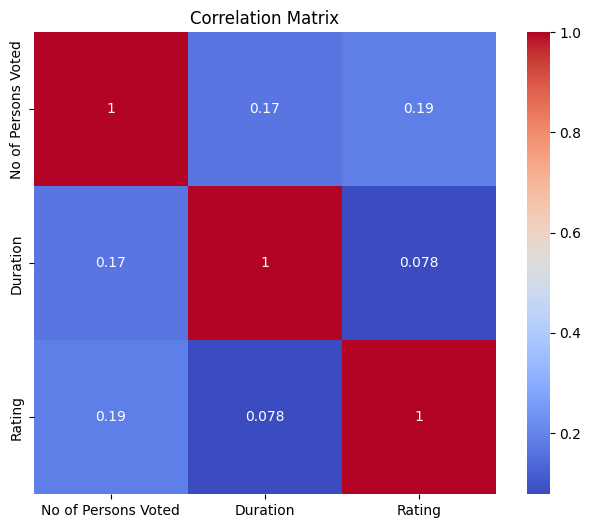

In [172]:
plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm', square=True)
plt.title('Correlation Matrix')
plt.show()

In [173]:
df.head()

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category,Decade,Count,High Rated,Genre Combination,Directed Count,Directed Type
0,Dekalog (1988),1996-03-22,This masterwork by Krzysztof Kieślowski is one...,7.4,118.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz",572,[Drama],3,1996,Drama,Long,1990,False,0,Drama,1,Single
1,Three Colors: Red,1994-11-23,Krzysztof Kieslowski closes his Three Colors t...,8.3,241.0,Krzysztof Kieslowski,"Krzysztof Kieslowski, Krzysztof Piesiewicz, Ag...",99,"[Drama, Mystery, Romance]",11,1994,Drama,Medium,1990,True,1,"Drama,Mystery,Romance",1,Single
4,The Conformist,1970-10-22,"Set in Rome in the 1930s, this re-release of B...",7.3,106.0,Bernardo Bertolucci,"Alberto Moravia, Bernardo Bertolucci",107,[Drama],10,1970,Drama,Medium,1970,False,0,Drama,1,Single
5,Tokyo Story,1972-03-13,Yasujiro Ozu’s Tokyo Story follows an aging co...,8.1,147.0,Yasujirô Ozu,"Kôgo Noda, Yasujirô Ozu",136,[Drama],3,1972,Drama,Long,1970,False,1,Drama,1,Single
6,The Leopard (re-release),2004-08-13,"Set in Sicily in 1860, Luchino Visconti's spec...",7.8,85.0,Luchino Visconti,"Giuseppe Tomasi di Lampedusa, Suso Cecchi D'Am...",187,"[Drama, History]",8,2004,Drama,Long,2000,True,1,"Drama,History",1,Single


In [174]:
lowest_rated_movies = df[df['Rating']* 10 < 50]
lowest_rated_movies

,Title,Release Date,Description,Rating,No of Persons Voted,Directed by,Written by,Duration,Genres,Release Month,Release Year,Genre,Duration Category,Decade,Count,High Rated,Genre Combination,Directed Count,Directed Type
278,Our Body,2023-08-04,Veteran documentarian Claire Simon observes th...,4.9,18.0,Claire Simon,Claire Simon,168,[Documentary],8,2023,Documentary,Long,2020,False,0,Documentary,1,Single
359,Days,2021-08-13,"Under the pain of illness and treatment, Kang ...",4.8,4.0,Ming-liang Tsai,Ming-liang Tsai,127,[Drama],8,2021,Drama,Long,2020,False,0,Drama,1,Single
625,Wojnarowicz,2021-03-19,Wojnarowicz: F**k You F*ggot F**ker is a fiery...,2.5,4.0,Chris McKim,Woody Allen,105,[Documentary],3,2021,Documentary,Medium,2020,False,0,Documentary,1,Single
970,In Transit,2017-06-23,In Transit journeys into the hearts and minds ...,4.8,4.0,"Albert Maysles, \n \n Lynn True, \n ...",Woody Allen,76,"[Documentary, News]",6,2017,Documentary,Short,2010,True,0,"Documentary,News",5,Multiple
1093,Restless Creature: Wendy Whelan,2017-05-24,Restless Creature: Wendy Whelan offers an inti...,4.0,4.0,"Linda Saffire, \n \n Adam Schlesinger",Woody Allen,90,[Documentary],5,2017,Documentary,Medium,2010,False,0,Documentary,2,Multiple
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43698,The Singing Forest,2003-11-14,"Two lovers, killed during the Holocaust, are r...",1.7,32.0,Jorge Ameer,Jorge Ameer,95,"[Drama, Fantasy, Romance]",11,2003,Drama,Medium,2000,True,0,"Drama,Fantasy,Romance",1,Single
43701,The Garbage Pail Kids Movie,1987-08-22,Dodger must confront the struggles of life as ...,1.0,21.0,Rod Amateau,"Linda Palmer, Rod Amateau, John Pound",100,"[Adventure, Comedy, Family, Fantasy, Musical]",8,1987,Adventure,Medium,1980,True,0,"Adventure,Comedy,Family,Fantasy,Musical",1,Single
43706,Death of a Nation,2018-08-03,Not since 1860 have the Democrats so fanatical...,4.3,302.0,"Dinesh D'Souza, \n \n Bruce Schooley","Dinesh D'Souza, Bruce Schooley",108,"[Documentary, History]",8,2018,Documentary,Medium,2010,True,0,"Documentary,History",2,Multiple
43708,United Passions,2015-06-05,"Three men—Jules Rimet (Gérard Depardieu), Joao...",0.8,248.0,Frédéric Auburtin,"Frédéric Auburtin, Jean-Paul Delfino",110,"[Drama, History, Sport]",6,2015,Drama,Medium,2010,True,0,"Drama,History,Sport",1,Single


In [175]:
proption_low_rating = lowest_rated_movies.groupby('Decade')['Rating'].count()/df.groupby('Decade')['Rating'].count()
proption_low_rating

Decade
1970    0.032663
1980    0.041341
1990    0.072143
2000    0.092498
2010    0.089480
2020    0.137900
Name: Rating, dtype: float64

In [176]:
fig= px.line(proption_low_rating.reset_index(), x='Decade', y='Rating', title='Proportion of Low Rated Movies Over Decades')
fig.update_layout(xaxis_title='Decade', yaxis_title='Proportion')
fig.show()

In [177]:

avg_rating = df.groupby(['Decade', 'Genre'])['Rating'].mean().reset_index()
avg_rating

,Decade,Genre,Rating
0,1970,Action,6.855880
1,1970,Adventure,7.063232
2,1970,Animation,6.740000
3,1970,Biography,7.479139
4,1970,Comedy,6.993999
...,...,...,...
92,2020,Mystery,5.619605
93,2020,Romance,7.000000
94,2020,Sci-Fi,5.600000
95,2020,Thriller,6.021796


In [178]:
avg_rating_sorted = avg_rating.sort_values(by='Rating', ascending=False)
avg_rating_sorted.head(5)

,Decade,Genre,Rating
25,1980,Romance,8.200000
42,1990,Thriller,7.900000
8,1970,Fantasy,7.850000
87,2020,Family,7.758816
15,1980,Animation,7.575000


In [179]:
fig = px.bar(avg_rating, x='Decade', y='Rating', color='Genre', title='Average Rating by Decade and Genre', color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(xaxis_title='Decade',yaxis_title='Average Rating')
fig.show()

In [180]:
from gender_guesser.detector import Detector
detector = Detector()
df['Director Gender'] = df['Directed by'].apply(lambda x: detector.get_gender(x.split()[0]))
df['Director Gender'] = df['Director Gender'].apply(lambda x: x if x in ['male', 'female'] else 'Unknown')
gender_stats = df.groupby('Director Gender')['Rating'].agg(['count', 'mean']).reset_index()
gender_stats

,Director Gender,count,mean
0,Unknown,2106,6.594312
1,female,1804,6.474741
2,male,10530,6.622813


In [181]:
fig = px.bar(gender_stats, x='Director Gender', y='count', title='Movies Count by Director Gender')
fig.update_layout(xaxis_title='Director Gender', yaxis_title='Average Rating')
fig.show()

In [182]:
import nltk
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = stopwords.words('english')
from textblob import TextBlob
from sklearn.metrics import mean_squared_error

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [183]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
clf1 = Pipeline([('Vectorizer', TfidfVectorizer(stop_words='english')),('regressor',LinearRegression())])

In [184]:
x = df['Description']
y = df['Rating']
xtrain, xtest, ytrain, ytest, = train_test_split(x,y, test_size=0.2, random_state=42)
clf1.fit(xtrain,ytrain)

Pipeline(steps=[('Vectorizer', TfidfVectorizer(stop_words='english')),
                ('regressor', LinearRegression())])

In [185]:
pred1 = clf1.predict(xtest)
mse = mean_squared_error(ytest, pred1)
mse

np.float64(2.9232314157938752)

In [186]:
coefficients = clf1.named_steps['regressor'].coef_
feature_names = clf1.named_steps['Vectorizer'].get_feature_names_out()

In [187]:
keyword_coefficients = pd.DataFrame({'Keyword': feature_names, 'Coefficients': coefficients})

In [188]:
keyword_coefficients = keyword_coefficients.sort_values(by='Coefficients', ascending=False)

In [189]:
top_negative = keyword_coefficients.tail(10)
top_negative

,Keyword,Coefficients
20021,lurks,-6.379254
19186,leftist,-6.404204
5107,campaigns,-6.446691
24605,peculiar,-6.519357
33005,telfair,-6.535389
4906,butts,-6.586943
33506,tinted,-6.632455
4666,bucky,-6.660940
33070,tennis,-7.341684
32517,swimmer,-7.658553


In [190]:
top_positive = keyword_coefficients.head(10)
top_positive

,Keyword,Coefficients
23637,operas,7.278971
24325,paratroopers,6.004285
27423,rekindles,5.467239
13770,gil,5.454697
20578,marder,5.392569
31469,standards,5.315940
10212,dupree,5.251622
707,acid,5.196607
27171,recuperating,5.121978
23290,nutty,5.077616


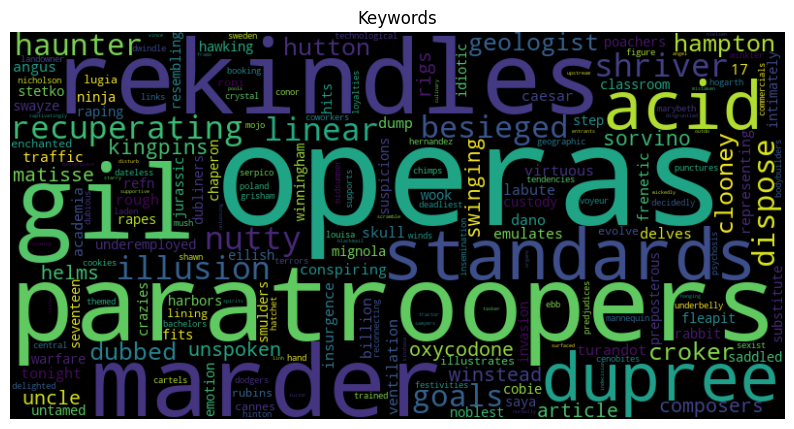

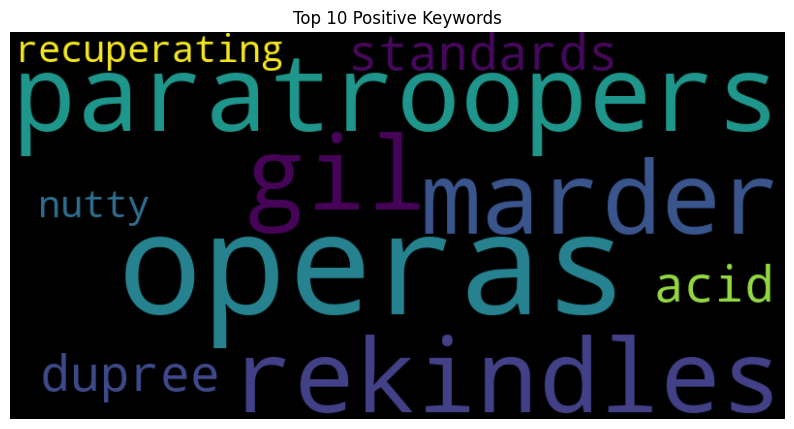

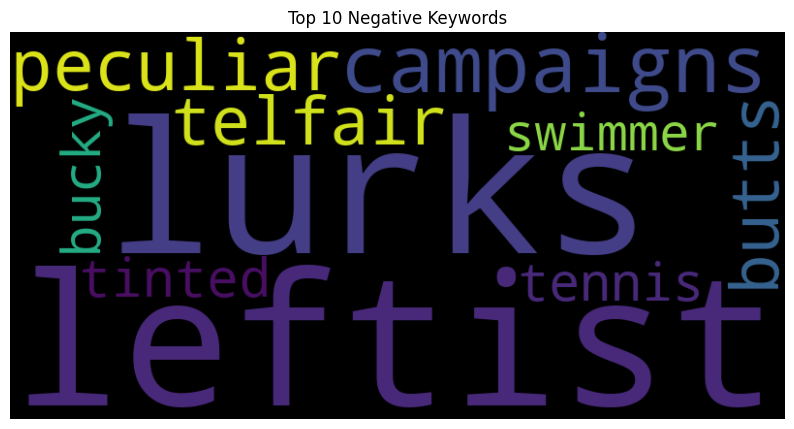

In [191]:
from wordcloud import WordCloud 
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(keyword_coefficients.set_index('Keyword')['Coefficients'].to_dict())
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Keywords')
plt.axis('off')
plt.show()
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(top_positive.set_index('Keyword')['Coefficients'].to_dict())
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top 10 Positive Keywords')
plt.axis('off')
plt.show()
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(top_negative.set_index('Keyword')['Coefficients'].to_dict())
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top 10 Negative Keywords')
plt.axis('off')
plt.show()